# Problem statement: Analyse to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.

## Approach
## Step 1: Data Understanding
## Step 2: Data cleaning

## ===========================================================

## Import necessary python libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Show all rows in pandas commands
pd.set_option("display.max_rows", None)

## Load dataset

In [4]:
df = pd.read_csv('loan.csv')

## Step 1: Data Understanding

In [5]:
df.shape

(39717, 111)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [7]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [8]:
# Total number of Rows 39717
# Total number of Columns 111


In [9]:
df.isnull().mean()

id                                0.000000
member_id                         0.000000
loan_amnt                         0.000000
funded_amnt                       0.000000
funded_amnt_inv                   0.000000
term                              0.000000
int_rate                          0.000000
installment                       0.000000
grade                             0.000000
sub_grade                         0.000000
emp_title                         0.061913
emp_length                        0.027066
home_ownership                    0.000000
annual_inc                        0.000000
verification_status               0.000000
issue_d                           0.000000
loan_status                       0.000000
pymnt_plan                        0.000000
url                               0.000000
desc                              0.325855
purpose                           0.000000
title                             0.000277
zip_code                          0.000000
addr_state 

In [10]:
df.isnull().sum()

id                                    0
member_id                             0
loan_amnt                             0
funded_amnt                           0
funded_amnt_inv                       0
term                                  0
int_rate                              0
installment                           0
grade                                 0
sub_grade                             0
emp_title                          2459
emp_length                         1075
home_ownership                        0
annual_inc                            0
verification_status                   0
issue_d                               0
loan_status                           0
pymnt_plan                            0
url                                   0
desc                              12942
purpose                               0
title                                11
zip_code                              0
addr_state                            0
dti                                   0


## Step 1 Conclusion:
- There are many columns with null values for all the rows
- Hence we need data cleaning

# Step 2: Data cleaning

In [11]:
# Strategy - missing values column 
# (a) Columns having high percentage of missing values (>60%), directly discard that column from the analysis

# (b) Columns having missing values under acceptable range we prefer to impute them(replace with some values)
# (c) For numarical columns we prefer to use mean or median (Median is preferred)
# (d) Median is not affected with the outliers
# (e) for categorical column we refer to use mode
# (f) if we have very less missing values in any column in that case you can drop rows as well
# (g) for a target variable - if there are missing values, drop the row

# removing columns which has all values as null

In [12]:
df_clean = df.drop(['tot_hi_cred_lim','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mo_sin_old_il_acct', 'bc_util', 'bc_open_to_buy', 'avg_cur_bal', 'acc_open_past_24mths', 'inq_last_12m', 'total_cu_tl', 'inq_fi', 'total_rev_hi_lim', 'all_util', 'max_bal_bc', 'open_rv_24m', 'open_rv_12m', 'il_util', 'total_bal_il', 'mths_since_rcnt_il', 'open_il_24m', 'open_il_12m', 'open_il_6m', 'open_acc_6m', 'tot_cur_bal', 'tot_coll_amt','mths_since_last_major_derog','annual_inc_joint','dti_joint','verification_status_joint'], axis=1)

In [13]:
df_clean.shape

(39717, 57)

In [14]:
df_clean.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12942
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

In [15]:
df_clean.isnull().mean()

id                            0.000000
member_id                     0.000000
loan_amnt                     0.000000
funded_amnt                   0.000000
funded_amnt_inv               0.000000
term                          0.000000
int_rate                      0.000000
installment                   0.000000
grade                         0.000000
sub_grade                     0.000000
emp_title                     0.061913
emp_length                    0.027066
home_ownership                0.000000
annual_inc                    0.000000
verification_status           0.000000
issue_d                       0.000000
loan_status                   0.000000
pymnt_plan                    0.000000
url                           0.000000
desc                          0.325855
purpose                       0.000000
title                         0.000277
zip_code                      0.000000
addr_state                    0.000000
dti                           0.000000
delinq_2yrs              

In [16]:
# Question?? should we drop column mths_since_last_delinq, mths_since_last_record, next_pymnt_d

In [17]:
df_clean.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,Jun-16,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [18]:
# Categorical columns
cats_cols=["term","int_rate","grade","sub_grade","","emp_length","home_ownership", "verification_status","loan_status","purpose","title","zip_code","addr_state","delinq_2yrs","inq_last_6mths", "mths_since_last_delinq", "pub_rec","pub_rec_bankruptcies"]
# Numerical columns
num_cols=["loan_amnt","funded_amnt", "funded_amnt_inv", "annual_inc","dti","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp","total_rec_int","recoveries"]
# Not relevant to the analysis
extra_cols=["id","member_id","installment","emp_title", "issue_d","pymnt_plan", "desc","earliest_cr_line","mths_since_last_record","total_rec_late_fee","collection_recovery_fee","last_pymnt_d","collections_12_mths_ex_med"]

# dont know
#"open_acc","revol_bal","revol_util","total_acc","last_credit_pull_d",""

In [19]:
# Remove Rows
# Remove rows where emp_title is null ??? or instead of removing rows we add some values to that field, anyways this  column is not important for analysis == to be finalized
# command
# df_clean = df_clean[~(df_clean['emp_title'].isnull())]

# same for emp_length
# df_clean = df_clean[~(df_clean['emp_length'].isnull())]

In [20]:
# Remove Columns
# pymnt_plan = all the values in this column is 'n' - so column is not needed hence removed
# initial_list_status = all the values in this column is 'f' - so column is not needed hence removed
# collections_12_mths_ex_med - single value, hence removed
# policy_code - single value, hence removed
# application_type - single value, hence removed
# verification_status_joint - single value, hence removed
# chargeoff_within_12_mths - single value, hence removed
# delinq_amnt - single value, hence removed
# tax_liens - single value, hence removed
# month_since_last_record and next_paymnt_d - as more than 90% of data is missing
# desc column - not needed as this is covered in loan purpose

In [21]:
# Update values in rows
# mths_since_last_delinq - do we add median value for this column?
#Can be removed more than 90% of the data is missing


In [22]:
df_clean.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_

In [23]:
df_clean = df_clean.drop(['pymnt_plan','initial_list_status','collections_12_mths_ex_med','policy_code','application_type','acc_now_delinq','delinq_amnt','tax_liens','mths_since_last_record','next_pymnt_d','desc'], axis=1)

In [24]:
# below code to identify which columns are needed and which ones can be dropped

In [25]:
df_clean["mths_since_last_delinq"].dtype

dtype('float64')

In [26]:
df_clean["mths_since_last_delinq"].isnull().sum()

25682

In [27]:
df_clean["mths_since_last_delinq"].isnull().mean()

0.6466248709620566

In [28]:
df_clean["mths_since_last_delinq"].value_counts()

mths_since_last_delinq
0.0      443
15.0     252
30.0     247
23.0     247
24.0     241
19.0     238
38.0     237
20.0     233
18.0     231
22.0     231
31.0     229
35.0     227
32.0     226
39.0     224
25.0     223
45.0     222
37.0     217
26.0     217
21.0     216
17.0     214
16.0     214
27.0     212
36.0     210
42.0     208
10.0     208
29.0     207
47.0     206
43.0     201
34.0     201
44.0     200
14.0     198
46.0     197
41.0     197
40.0     197
12.0     195
48.0     194
28.0     193
6.0      192
33.0     188
9.0      182
7.0      176
13.0     171
8.0      168
11.0     166
4.0      153
49.0     152
5.0      151
58.0     148
3.0      145
59.0     143
53.0     143
52.0     137
56.0     134
73.0     131
50.0     131
55.0     129
68.0     128
63.0     127
60.0     126
57.0     125
72.0     124
71.0     122
70.0     119
54.0     115
74.0     114
67.0     113
62.0     113
75.0     112
76.0     112
61.0     110
69.0     108
51.0     107
79.0     103
2.0      101
66.0     101
78

In [29]:
#Check the datatypes of all the columns 

In [30]:
df_clean.dtypes

id                            int64
member_id                     int64
loan_amnt                     int64
funded_amnt                   int64
funded_amnt_inv             float64
term                         object
int_rate                     object
installment                 float64
grade                        object
sub_grade                    object
emp_title                    object
emp_length                   object
home_ownership               object
annual_inc                  float64
verification_status          object
issue_d                      object
loan_status                  object
url                          object
purpose                      object
title                        object
zip_code                     object
addr_state                   object
dti                         float64
delinq_2yrs                   int64
earliest_cr_line             object
inq_last_6mths                int64
mths_since_last_delinq      float64
open_acc                    

In [31]:
df_clean.shape

(39717, 46)

In [32]:
df_clean.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'chargeoff_within_12_mths', 'pub_rec_bankruptcies'],
      dtype='object')

In [33]:
df_clean["mths_since_last_delinq"].describe()

count    14035.000000
mean        35.900962
std         22.020060
min          0.000000
25%         18.000000
50%         34.000000
75%         52.000000
max        120.000000
Name: mths_since_last_delinq, dtype: float64

In [34]:
df_clean["mths_since_last_delinq"].median()

34.0

In [35]:
#There are two ways to deal with it 
#a)Delete the column because more than 60% of values are missing 
#b)Fill the missing values with median 
#TBD


In [36]:
df_clean.shape

(39717, 46)

In [37]:
#Filling other null values

In [38]:
df_clean.isnull().sum()

id                              0
member_id                       0
loan_amnt                       0
funded_amnt                     0
funded_amnt_inv                 0
term                            0
int_rate                        0
installment                     0
grade                           0
sub_grade                       0
emp_title                    2459
emp_length                   1075
home_ownership                  0
annual_inc                      0
verification_status             0
issue_d                         0
loan_status                     0
url                             0
purpose                         0
title                          11
zip_code                        0
addr_state                      0
dti                             0
delinq_2yrs                     0
earliest_cr_line                0
inq_last_6mths                  0
mths_since_last_delinq      25682
open_acc                        0
pub_rec                         0
revol_bal     

In [39]:
#emp_title
#Not sure what to do
df_clean["emp_title"].value_counts()

emp_title
US Army                                                                           134
Bank of America                                                                   109
IBM                                                                                66
AT&T                                                                               59
Kaiser Permanente                                                                  56
Wells Fargo                                                                        54
USAF                                                                               54
UPS                                                                                53
US Air Force                                                                       52
Walmart                                                                            45
Lockheed Martin                                                                    44
United States Air Force                     

In [40]:
#emp_length.
df_clean["emp_length"].value_counts()

emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Name: count, dtype: int64

In [41]:
df_clean["emp_length"].fillna(df_clean["emp_length"].mode()[0],inplace=True)

In [42]:
df_clean.isnull().sum()

id                              0
member_id                       0
loan_amnt                       0
funded_amnt                     0
funded_amnt_inv                 0
term                            0
int_rate                        0
installment                     0
grade                           0
sub_grade                       0
emp_title                    2459
emp_length                      0
home_ownership                  0
annual_inc                      0
verification_status             0
issue_d                         0
loan_status                     0
url                             0
purpose                         0
title                          11
zip_code                        0
addr_state                      0
dti                             0
delinq_2yrs                     0
earliest_cr_line                0
inq_last_6mths                  0
mths_since_last_delinq      25682
open_acc                        0
pub_rec                         0
revol_bal     

In [43]:
#title
#df_clean["title"].value_counts
df_clean["title"].fillna(df_clean["title"].mode()[0],inplace=True)

In [44]:
#mths_since_last_delinq
#Not sure what to do

df_clean["mths_since_last_delinq"].value_counts()

mths_since_last_delinq
0.0      443
15.0     252
30.0     247
23.0     247
24.0     241
19.0     238
38.0     237
20.0     233
18.0     231
22.0     231
31.0     229
35.0     227
32.0     226
39.0     224
25.0     223
45.0     222
37.0     217
26.0     217
21.0     216
17.0     214
16.0     214
27.0     212
36.0     210
42.0     208
10.0     208
29.0     207
47.0     206
43.0     201
34.0     201
44.0     200
14.0     198
46.0     197
41.0     197
40.0     197
12.0     195
48.0     194
28.0     193
6.0      192
33.0     188
9.0      182
7.0      176
13.0     171
8.0      168
11.0     166
4.0      153
49.0     152
5.0      151
58.0     148
3.0      145
59.0     143
53.0     143
52.0     137
56.0     134
73.0     131
50.0     131
55.0     129
68.0     128
63.0     127
60.0     126
57.0     125
72.0     124
71.0     122
70.0     119
54.0     115
74.0     114
67.0     113
62.0     113
75.0     112
76.0     112
61.0     110
69.0     108
51.0     107
79.0     103
2.0      101
66.0     101
78

In [45]:
#revol_util
df_clean["revol_util"].value_counts()

revol_util
0%        977
0.20%      63
63%        62
40.70%     58
66.70%     58
0.10%      58
31.20%     57
61%        57
46.40%     57
66.60%     57
65.90%     56
70.40%     56
57.40%     55
49.80%     55
48.90%     55
25.50%     55
37.60%     55
64.80%     55
27.20%     54
89.50%     54
35.30%     54
46.60%     54
51.10%     54
32%        54
76.60%     54
68.60%     54
78.70%     54
75.50%     54
64.60%     54
51.60%     54
72.10%     53
62.80%     53
54.30%     53
45.60%     53
55.80%     53
48.20%     53
47.80%     53
68.70%     53
33.70%     53
70.80%     53
34.40%     53
41%        53
70.10%     52
66.90%     52
55.10%     52
53.90%     52
51.50%     52
48%        52
41.60%     52
29.10%     52
70.30%     52
55.50%     52
74.90%     52
36.50%     52
40.20%     51
58.70%     51
41.40%     51
49.10%     51
89.90%     51
43.40%     51
30.90%     51
54.10%     51
35.70%     51
45.90%     51
88%        51
66.10%     51
49.60%     51
54.60%     51
57.90%     50
52.30%     50
19.80%   

In [46]:
#use mode 
df_clean["revol_util"].fillna(df_clean["revol_util"].mode()[0],inplace=True)

In [47]:
#use mode
df_clean["last_pymnt_d"].fillna(df_clean["last_pymnt_d"].mode()[0],inplace=True)


In [48]:
#last_credit_pull_d --- Use mode
df_clean["last_credit_pull_d"].fillna(df_clean["last_credit_pull_d"].mode()[0],inplace=True)

In [49]:
#charge_off_within_12mths"
df_clean["chargeoff_within_12_mths"].value_counts()

chargeoff_within_12_mths
0.0    39661
Name: count, dtype: int64

In [50]:
#all values are zero,we can either drop this column or impute the remaining values with 0
#drop the column
df_clean = df_clean.drop(["chargeoff_within_12_mths"],axis=1)

In [51]:
#pub_rec_bankruptcies
df_clean["pub_rec_bankruptcies"].value_counts()

pub_rec_bankruptcies
0.0    37339
1.0     1674
2.0        7
Name: count, dtype: int64

In [52]:
df_clean["pub_rec_bankruptcies"].fillna(df_clean["pub_rec_bankruptcies"].mode()[0],inplace=True)

In [53]:
#Columns significant for analysis
#loan_amnt --- As it will be related to installment
#int_rate
#installment
#emp_length---stability of income
#home ownnership
#annual_income -- derive monthly income from this
#verification_status
#loan_status
#purpose
#dti
#addr_state
#pub_rec
#revol_util
#pub_rec_bankruptcies



In [55]:
#Step 3: Amalysis
#- Continuous variables
#- Categorical variables

In [56]:
df_clean.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'url', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies'],
      dtype='object')

In [57]:
df_clean.loan_status.value_counts()

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

In [58]:
# picking only customers who have either fully paid loan or are defaulted. excluding current customers, as we are not sure how they wil behave.
df_clean = df_clean[df_clean['loan_status']!='Current']

In [59]:
df_clean.shape

(38577, 45)

In [192]:
df_clean.describe

<bound method NDFrame.describe of             id  member_id  loan_amnt  funded_amnt  funded_amnt_inv  \
0      1077501    1296599       5000         5000      4975.000000   
1      1077430    1314167       2500         2500      2500.000000   
2      1077175    1313524       2400         2400      2400.000000   
3      1076863    1277178      10000        10000     10000.000000   
5      1075269    1311441       5000         5000      5000.000000   
6      1069639    1304742       7000         7000      7000.000000   
7      1072053    1288686       3000         3000      3000.000000   
8      1071795    1306957       5600         5600      5600.000000   
9      1071570    1306721       5375         5375      5350.000000   
10     1070078    1305201       6500         6500      6500.000000   
11     1069908    1305008      12000        12000     12000.000000   
12     1064687    1298717       9000         9000      9000.000000   
13     1069866    1304956       3000         3000      3

In [61]:
# Categorical columns
cats_cols=["term","int_rate", "installment","grade","sub_grade","","emp_length","home_ownership", "verification_status","loan_status","purpose","title","zip_code","addr_state","delinq_2yrs","inq_last_6mths", "mths_since_last_delinq", "pub_rec","pub_rec_bankruptcies"]
# Numerical columns
num_cols=["loan_amnt","funded_amnt", "funded_amnt_inv", "annual_inc","dti","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp","total_rec_int","recoveries"]


In [62]:
df_clean["annual_inc"].value_counts()

annual_inc
60000.00      1466
50000.00      1029
40000.00       855
45000.00       811
30000.00       808
75000.00       786
65000.00       779
70000.00       714
48000.00       696
80000.00       636
55000.00       631
36000.00       614
42000.00       591
90000.00       548
35000.00       508
100000.00      498
120000.00      482
85000.00       472
72000.00       471
24000.00       401
52000.00       382
54000.00       359
110000.00      307
95000.00       275
62000.00       262
25000.00       247
78000.00       241
38000.00       237
150000.00      223
32000.00       216
58000.00       211
130000.00      209
96000.00       202
56000.00       202
125000.00      202
43000.00       200
66000.00       198
105000.00      196
68000.00       192
53000.00       188
63000.00       187
57000.00       181
51000.00       181
33000.00       180
84000.00       178
37000.00       172
140000.00      160
47000.00       160
44000.00       159
38400.00       153
46000.00       149
115000.00      146
3

In [63]:
df_clean["annual_inc"].dtype

dtype('float64')

In [65]:

# impact of innual_inc on loan_status - it is observed that there is not much impact
# impact of installment on loan_status - it is observed that there is no impact of monthly installment





# for each term - count of charged off
# for higher 'int_rate' - count of charged off
# for higher 'installment' - count of charged off
# for which grades - count of charged off
# for which sub grades - count of charged off
# for 'emp_title' - count of charged off
# does 'emp_length' affect charged off
# does 'home_ownership' affect charged off
# does 'verification_status' affect charged off
# does 'purpose' affect charged off
# does 'zip_code' or 'addr_state' affect charged off
# does 'dti' affect charged off
# does "delinq_2yrs" affect charged off
# mths_since_last_delinq
# pub_rec


In [66]:
df_clean.annual_inc.describe()

count    3.857700e+04
mean     6.877797e+04
std      6.421868e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.886800e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

In [107]:
x90 = np.percentile(df_clean.annual_inc,90)
print(x90)

115000.0


In [108]:
df_annualincome90 = df_clean[df_clean.annual_inc<115000]

In [109]:
df_annualincome90.shape

(34577, 45)

<Axes: xlabel='loan_status', ylabel='annual_inc'>

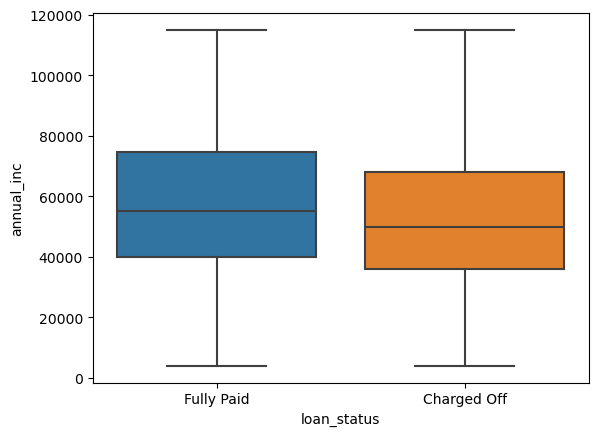

In [110]:
sns.boxplot(x=df_annualincome90.loan_status,y=df_annualincome90.annual_inc)


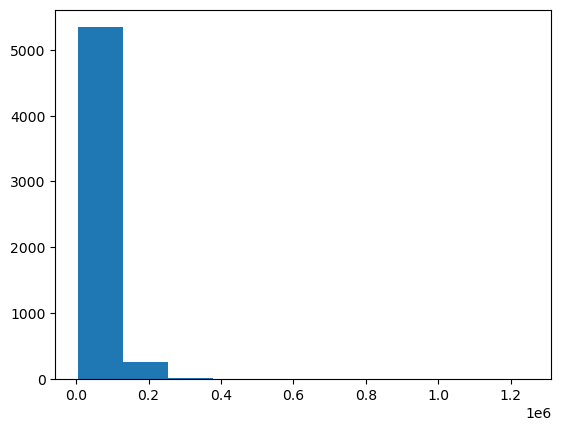

In [248]:
#Create a histogram of the Reviews
plt.hist(df_clean[df_clean.loan_status=='Charged Off'].annual_inc)
plt.show()

In [114]:
x90 = np.percentile(df_clean.installment,90)
print(x90)

620.9


In [116]:
df_installment90 = df_clean[df_clean.installment<620.9]

In [117]:
df_installment90.shape

(34718, 45)

<Axes: xlabel='loan_status', ylabel='installment'>

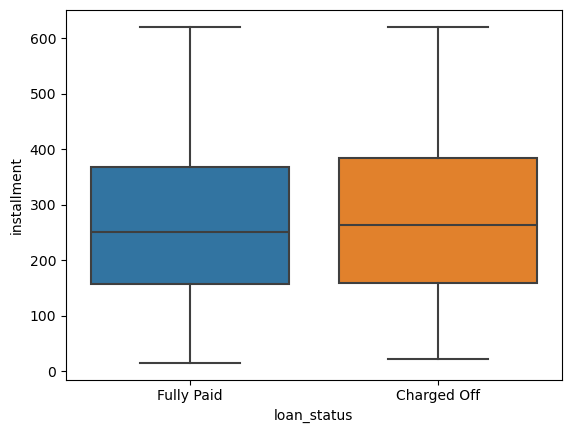

In [118]:
sns.boxplot(x=df_installment90.loan_status,y=df_installment90.installment)


In [133]:
df_clean.delinq_2yrs.value_counts()

delinq_2yrs
0     34386
1      3207
2       673
3       212
4        60
5        21
6        10
7         4
8         2
9         1
11        1
Name: count, dtype: int64

In [137]:
x90 = np.percentile(df_clean.delinq_2yrs,80)
print(x90)

0.0


In [177]:
df_delinq_2yrs=df_clean[(df_clean.delinq_2yrs>1) & (df_clean.delinq_2yrs<8)]

In [178]:
df_delinq_2yrs.shape

(980, 45)

<Axes: xlabel='loan_status', ylabel='delinq_2yrs'>

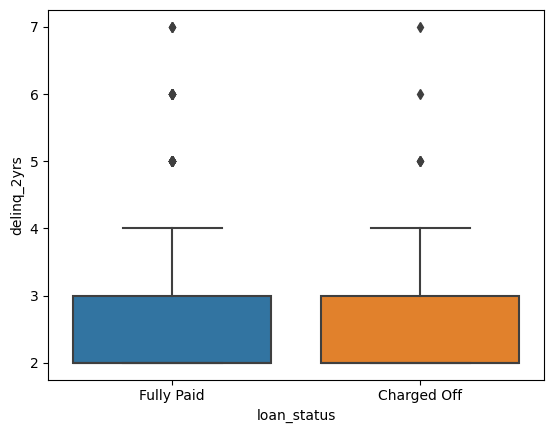

In [179]:
sns.boxplot(x=df_delinq_2yrs.loan_status,y=df_delinq_2yrs.delinq_2yrs)


In [186]:
df_clean.pub_rec.value_counts()

pub_rec
0    36507
1     2013
2       48
3        7
4        2
Name: count, dtype: int64

In [182]:
df_clean.pub_rec.describe()

count    38577.000000
mean         0.055422
std          0.237804
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: pub_rec, dtype: float64

In [185]:
x90 = np.percentile(df_clean.pub_rec,95)
print(x90)

1.0


In [187]:
df_pub_rec90 = df_clean[df_clean.pub_rec>0]

In [189]:
df_pub_rec90.shape

(2070, 45)

<Axes: xlabel='loan_status', ylabel='pub_rec'>

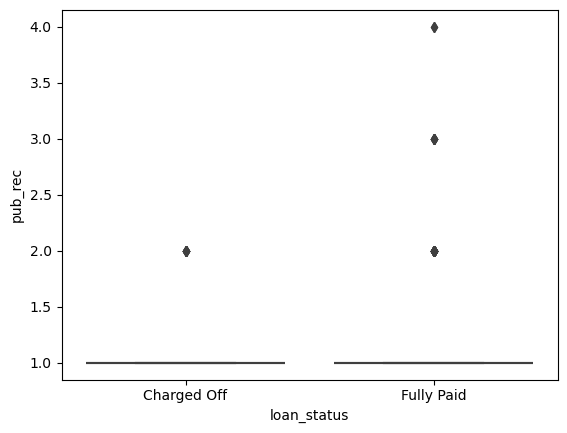

In [188]:
sns.boxplot(x=df_pub_rec90.loan_status,y=df_pub_rec90.pub_rec)


In [197]:
res=pd.pivot_table(data=df_clean, index="loan_status", columns="verification_status",values="id", aggfunc='count')

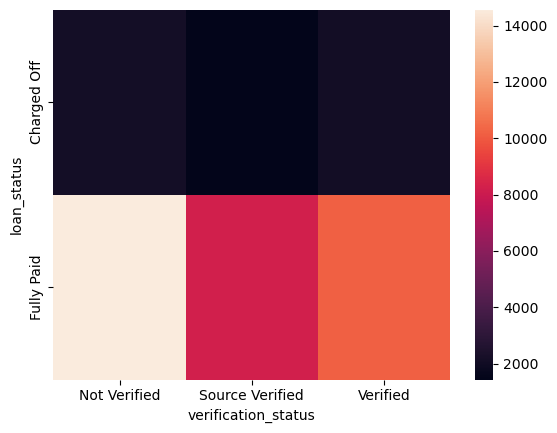

In [198]:
sns.heatmap(res)
plt.show()

In [203]:
df_clean.revol_bal.describe()

count     38577.000000
mean      13289.489826
std       15866.492241
min           0.000000
25%        3650.000000
50%        8762.000000
75%       16912.000000
max      149588.000000
Name: revol_bal, dtype: float64

In [204]:
x90 = np.percentile(df_clean.revol_bal,80)
print(x90)

19617.0


In [205]:
df_revol_bal90 = df_clean[df_clean.revol_bal<19617]

<Axes: xlabel='loan_status', ylabel='revol_bal'>

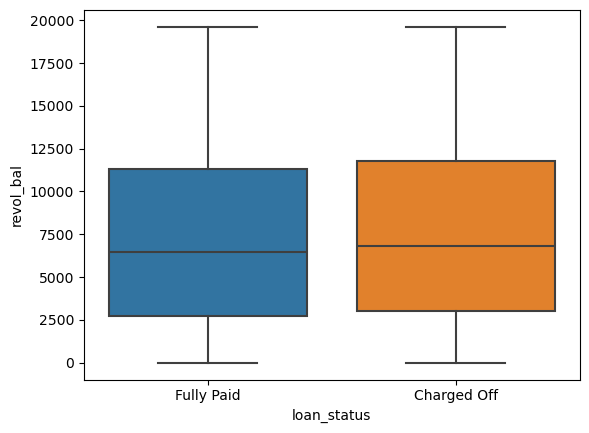

In [206]:
sns.boxplot(x=df_revol_bal90.loan_status,y=df_revol_bal90.revol_bal)


In [126]:
df_clean['pub_rec_bankruptcies'].value_counts()

pub_rec_bankruptcies
0.0    36935
1.0     1637
2.0        5
Name: count, dtype: int64

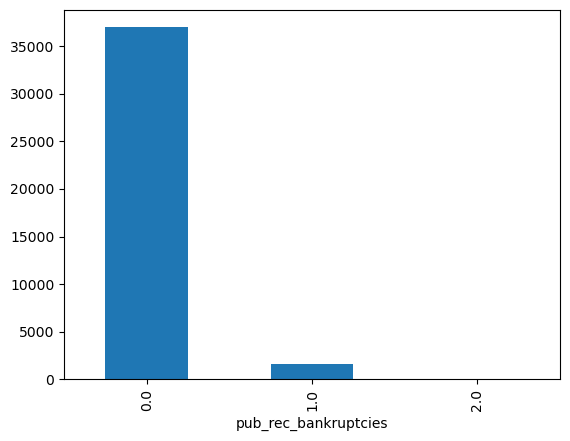

In [123]:
df_clean['pub_rec_bankruptcies'].value_counts().plot.bar()
plt.show()

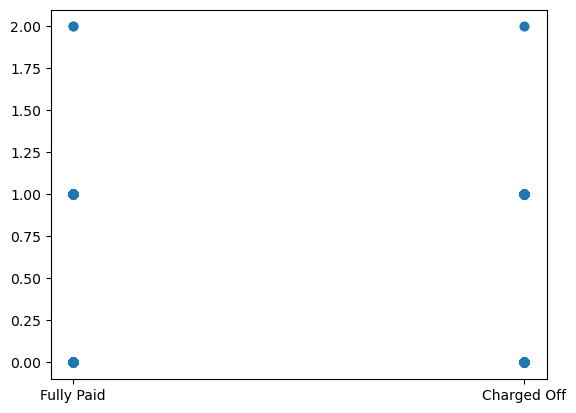

In [129]:
plt.scatter(df_clean['loan_status'], df_clean['pub_rec_bankruptcies'])
plt.show()